In [1]:
import importlib
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import radius_neighbors_graph
import alphashape
from shapely.geometry import Polygon
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.decomposition import PCA
import matplotlib.patches as mpatches
import umap
from scipy import stats
from sklearn.metrics import davies_bouldin_score
import seaborn as sns
from scipy.spatial.distance import cdist
from scipy.stats import ttest_ind, mannwhitneyu
import funciones_memoria
from funciones_memoria import cluster_and_plot_scaled
from funciones_memoria import gene_count_csv
from funciones_memoria import cell_anotation
from funciones_memoria import plot_annotation
from funciones_memoria import plot_area
from funciones_memoria import csv_cytomap
from funciones_memoria import all_sample_df
from funciones_memoria import calculate_deg
from funciones_memoria import multi_comparison_heatmap
from funciones_memoria import divide_regions
from funciones_memoria import plot_melanoma_by_region
from funciones_memoria import all_sample_division_df
from funciones_memoria import region_comparison_heatmap



## Introducción 

La hibridación fluorescente in situ de RNA (RNA FISH) permite analizar la expresión génica a nivel de célula única. En nuestro caso estamos usando *single molecule* RNA FISH con una lista de 100 genes que se compone de genes relacionados con la función del sistema nervioso y del sistema inmune. El objetivo es identificar expresión diferencial de genes entre las mustras resistentes o sensibles a la inmunoterapia con el fin de identificar mecanismos que contribuyan a este comportamiento diferencial de los tumores.   
  
El resultado de esta técnica es una tabla que indica el gen y sus coordenadas 'x', 'y' y 'z'.  




In [2]:
#tabla de la expresión espacial de los genes
df_raw_data = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/Resolve/32873-slide3_B1-2_results.txt", sep = '\t', header = None) 
# Eliminar la columna de NaN
df_raw_data = df_raw_data.dropna(axis=1, how='all')
df_raw_data.columns = ['x', 'y', 'z', 'gene']

df_raw_data.head()

,x,y,z,gene
0,1467,62,11,Adgre1
1,1512,145,11,Adgre1
2,1670,9,11,Adgre1
3,1675,154,11,Adgre1
4,1696,87,11,Adgre1


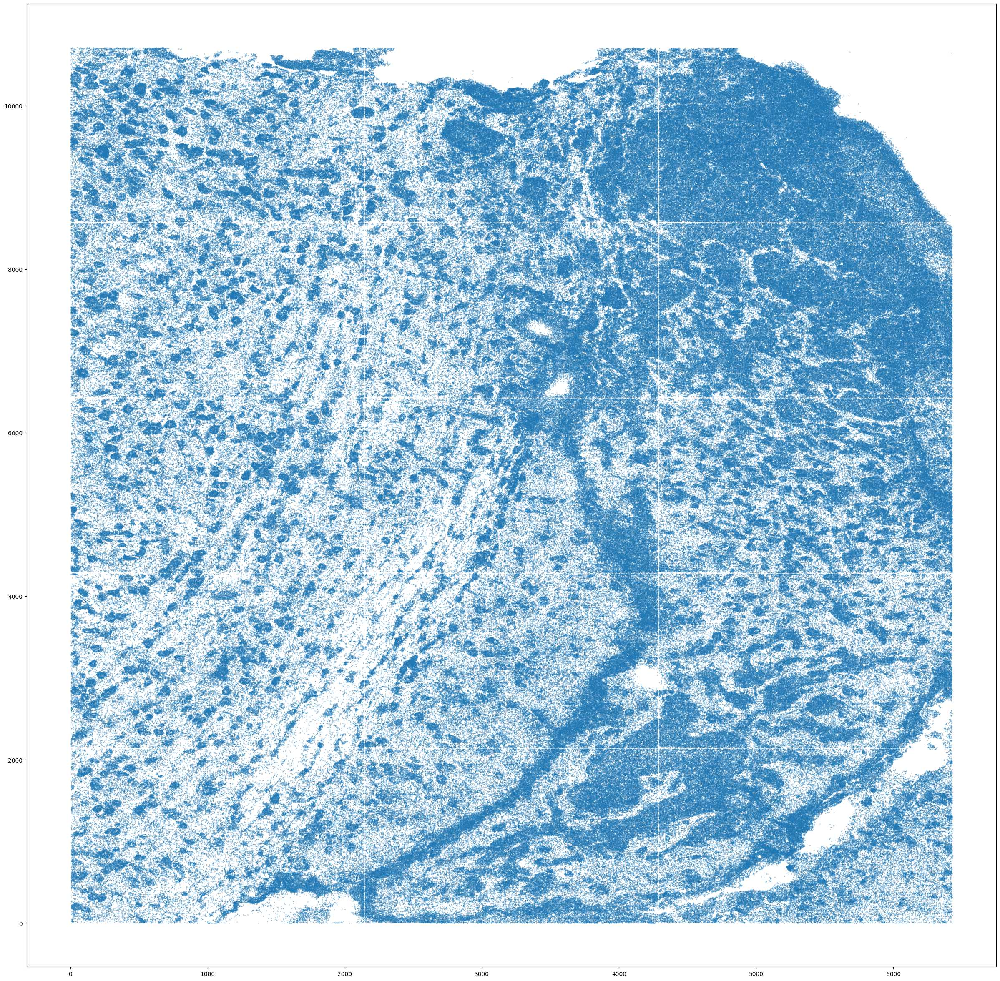

In [3]:
#este scatterplot muestra la distribución de todos los genes de una de las muestras
fig, ax = plt.subplots(figsize=(30, 30))
ax.scatter(df_raw_data['x'], df_raw_data['y'], s = 0.1)
plt.show()


Debido a la problemática de la segmentación debido a la carencia de imágenes del tejido con marcadores de membrana, se trató de agrupar los tránscritos mediante técnicas de clustering de aprendizaje automático, con el objetivo de que cada clúster represente un área de un tipo célular concreto. Para ello se trató de usar agglomerative clustering, que permite agrupar los tránscritos teniendo en cuenta el espacio. 

## Agglomerative clustering

Para aplicar este método se hizo una lista de genes marcadores de los distintos tipos celulares que se podían encontrar en un corte histológico de metástasis cerebral. Se asignó un color a los distintos genes marcadores en función del tipo celular al que pertenecían para así poder visualizar posteriormente la clusterización. 

In [4]:
genes_coloreados = {
    "Astrocytes": {
        "Gfap": "#1f77b4",
        "Aldh1l1": "#4F9ED2",
        "Aqp4": "#75D9FB",
    },
    "Neurons": {
        "Map2": "#8e44ad",
        "Nefm": "#9b59b6",
        "Nsg2": "#BB8FCE",
        "Rbfox3": "#7E02AF",
    },
    "Melanoma": {
        "Dct": "saddlebrown",
        "Mitf": "chocolate",
        "Pmel": "peru",
    },
    "T_cells": {
        "Cd4": "#B71C1C",
        "Foxp3": "#C62828",
        "Cd8a": "#D32F2F",
        "Cd3e": "#E53935",
    },
    "B_cells": {
        "Cd19": "#F44336",
    },
    "NK_cells": {
        "Klrg1": "#E53935",
        "Nkx1-1": "#F44336",
    },
    "Leukocytes": {
        "Ptprc": "#EF5350",
    },
    "Dendritic_cells": {
        "Flt3": "#11572E",
        "Itgae": "#1E8449",
        "Itgax": "#27AE60",
    },
    "Microglia": {
        "P2ry12": "#FF00D9",
        "Tmem119": "#FF00DD",
    },
    "Mieloides": {
        "Cd24a": "#F3C708",
        "Itgam": "#F7CA06",
        "Ly6g": "#CEBD1D",
        "Adgre1": "#FBE203",
    },
    "Oligodendrocytes": {
        "Mog": "#17A589",
        "Olig1": "#48C9B0",
    },
    "Vasculature": {
        "Acta2": "#343232",
        "Fn1": "#616161",
        "Myh11": "#353434",
        "Pecam1": "#444444",
    },
}
genes_tipo = {
    "Astrocytes": ["Gfap", "Aldh1l1", "Aqp4"],
    "Neurons": ["Map2", "Nefm", "Nsg2", "Rbfox3"],
    "Melanoma": ["Dct", "Mitf", "Pmel", "Slc7a5"],
    "T_cells": ["Cd4", "Foxp3", "Cd8a", "Cd3e"],
    "B_cells": ["Cd19"],
    "NK_cells": ["Klrg1", "Nkx1-1"],
    "Leukocytes": ["Ptprc"],
    "Dendritic_cells": ["Flt3", "Itgae", "Itgax"],
    "Microglia": ["P2ry12", "Tmem119"],
    "Myeloid": ["Cd24a", "Itgam", "Ly6g", "Adgre1"],
    "Oligodendrocytes": ["Mog", "Olig1"],
    "Vasculature": ["Acta2", "Fn1", "Myh11", "Pecam1"]
}
colores_tipo = {
    "Astrocytes": "#1f77b4",       # azul (usé un azul estándar)
    "Neurons": "#8e44ad",          # morado oscuro (el que tenías para Map2)
    "Melanoma": "saddlebrown",
    "T_cells": "#D32F2F",          # rojo medio
    "B_cells": "#F44336",           # rojo vibrante
    "NK_cells": "#E53935",          # rojo
    "Leukocytes": "#EF5350",        # rojo claro
    "Dendritic_cells": "#27AE60",   # verde medio
    "Microglia": "#FA04B8",         # verde oliva oscuro
    "Myeloid": "#FDD835",           # amarillo medio
    "Oligodendrocytes": "#48C9B0",  # cian medio
    "Vasculature": "#616161"        # gris medio
}


Cabe destacar el procesamiento previo de datos ralizado por Deyanira Borroto, así como la implementación inicial del método. Este procesamiento de datos consistio en dividir el tejido que se ha representado anteriormente en "subtiles" para poder desarrollar el código sin demasiado coste de computación. Como parte del procesamiento para implementar el método de "agglomerative clustering", se generó una matriz en la que cada fila es un tránscrito y las columnas indican las coordenadas "x" e "y" y el gen al que pertenece el tránscrito de forma binaria (en la columna del gen que identifica el tránscrito se pone un 1). Todos estos procedimientos se encuentran en https://github.com/Deya-B/Image_analysis/blob/main/Segmentacion_asistida_por_Transcritos.md

In [5]:
#cargamos la matriz para una de las tiles de la muestra
tile_id = (2, 2, "D") 
df = pd.read_csv(f"C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/deya/Coordinate_binary_expression_tables/tiles_B1-2/tile_{tile_id[0]}_{tile_id[1]}_subtiles/tile_{tile_id[0]}_{tile_id[1]}_{tile_id[2]}.csv") 
df.head()

,x,y,Acta2,Adgre1,Aldh1l1,Aldoc,Aqp4,Arg1,Axl,Ccl2,...,Tbx2,Tcf4,Tgfb2,Tgfbr1,Timp1,Tlr4,Tmem119,Trem2,Vegfa,Zeb1
0,3326,6467,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,3343,6452,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3371,6469,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3450,6675,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,3454,6675,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
df

,x,y,Acta2,Adgre1,Aldh1l1,Aldoc,Aqp4,Arg1,Axl,Ccl2,...,Tbx2,Tcf4,Tgfb2,Tgfbr1,Timp1,Tlr4,Tmem119,Trem2,Vegfa,Zeb1
0,3326,6467,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,3343,6452,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3371,6469,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3450,6675,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,3454,6675,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42647,3759,7211,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
42648,4191,6877,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
42649,3860,7005,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
42650,4105,6635,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
#variables con los mismos genes que el diccionario anterior y los tipos celulares
genes_marcadores = ['Gfap','Nefm','Aldh1l1','Aqp4','Foxp3','Cd8a', 'Map2','Aldoc',
                 'Flt3','Itgae','Itgax','Ptprc','Dct','Mitf','Pmel','Slc7a5','P2ry12','Cd3e','Cd4',
                 'Tmem119','Cd24a','Itgam','Ly6g','Adgre1','Nsg2','Rbfox3','Trem2','Klrg1',
                 'Nkx1-1','Mog','Olig1','Acta2','Fn1','Myh11','Pecam1']  


In [8]:
#hacemos una lista con todos los genes que se incluyen en el RNA FISH para hacer un clustering inicial teniendo en cuenta solo los genes
genoma = list(df.drop(columns=['x', 'y']).columns)
print(genoma)



['Acta2', 'Adgre1', 'Aldh1l1', 'Aldoc', 'Aqp4', 'Arg1', 'Axl', 'Ccl2', 'Ccl3', 'Ccl5', 'Ccr2', 'Cd19', 'Cd24a', 'Cd274', 'Cd3e', 'Cd4', 'Cd44', 'Cd47', 'Cd52', 'Cd69', 'Cd74', 'Cd8a', 'Csf1', 'Csf1r', 'Csf3r', 'Cspg4', 'Ctla4', 'Cxcl10', 'Cxcl12', 'Cxcl16', 'Cxcl3', 'Cxcr3', 'Cxcr4', 'Dct', 'Flt3', 'Fn1', 'Foxp3', 'Gap43', 'Gfap', 'Grem1', 'Gzmb', 'H2-K1', 'Havcr2', 'Hmga2', 'Icam1', 'Ifng', 'Ifngr1', 'Il10', 'Il1b', 'Itga4', 'Itgae', 'Itgam', 'Itgax', 'Itgb1', 'Klrg1', 'Lag3', 'Ly6g', 'Map2', 'Mitf', 'Mki67', 'Mmp9', 'Mog', 'Mrc1', 'Myh11', 'Ncr1', 'Nefm', 'Ngfr', 'Nkx1-1', 'Nr2f2', 'Nsg2', 'Olig1', 'P2ry12', 'Pdcd1', 'Pecam1', 'Plxnc1', 'Pmel', 'Prf1', 'Ptprc', 'Rbfox3', 'Sema7a', 'Serpine1', 'Sirpa', 'Slc7a5', 'Sox10', 'Sox4', 'Sox9', 'Sparcl1', 'Spp1', 'Stat1', 'Stat3', 'Tbx2', 'Tcf4', 'Tgfb2', 'Tgfbr1', 'Timp1', 'Tlr4', 'Tmem119', 'Trem2', 'Vegfa', 'Zeb1']


Se hace una primera clusterización utilizando todos los genes del experimento. 

Total number of clusters: 1592
Nº de clústers: 543


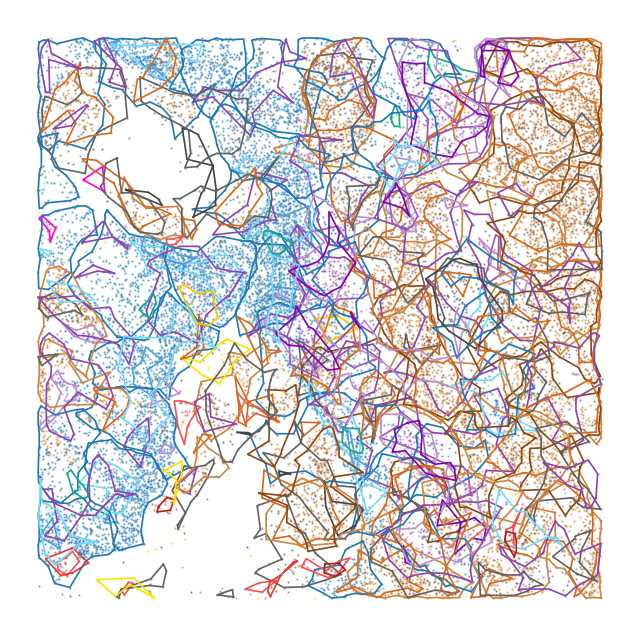

In [9]:
clustered = cluster_and_plot_scaled( 
    df,
    genoma,
    genes_color_dic=genes_coloreados,
    nombre_foto= 'genoma_entero',
    show_contour=True,
    peso_espacial=15,
    distance_threshold=7,
    alpha_val=0.03
)

Las zonas no se diferencian bien y hay mucho solapamiento. Se prueba con distintos parámetros o solo con los genes marcadores.

Total number of clusters: 580
Nº de clústers: 518


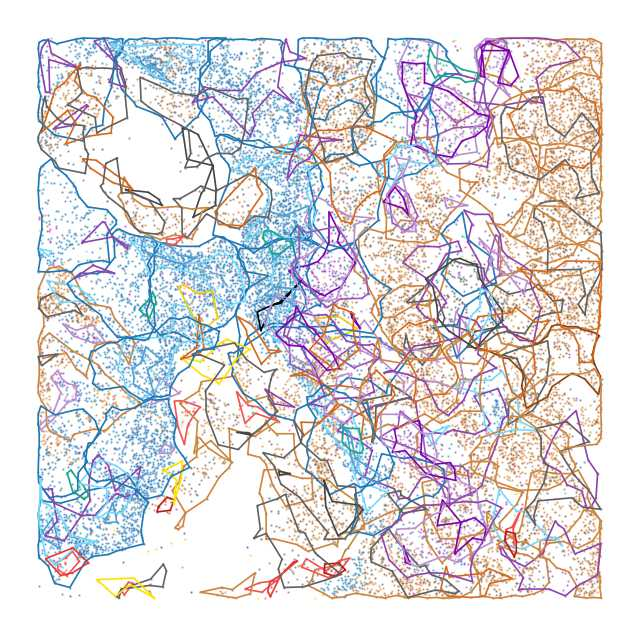

In [10]:
clustered = cluster_and_plot_scaled( 
    df,
    genes_marcadores,
    genes_color_dic=genes_coloreados,
    nombre_foto= 'genoma_entero',
    show_contour=True,
    peso_espacial=15,
    distance_threshold=7,
    alpha_val=0.03
)

Total number of clusters: 1214
Nº de clústers: 1067


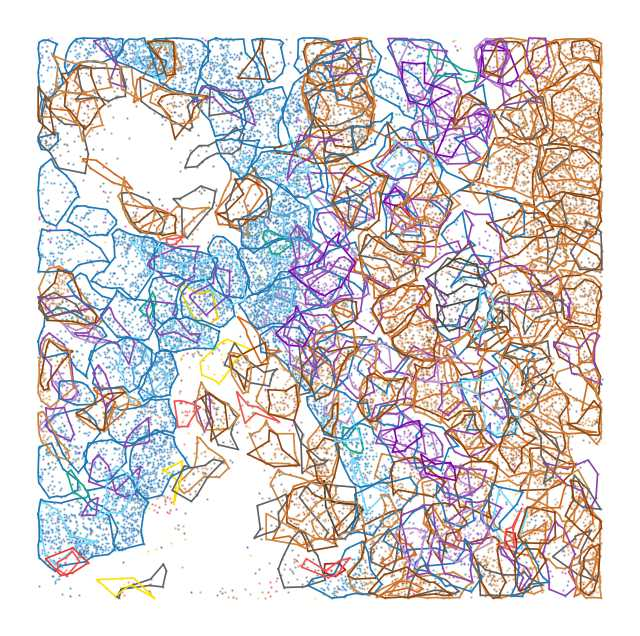

In [11]:
clustered = cluster_and_plot_scaled( 
    df,
    genes_marcadores,
    genes_color_dic=genes_coloreados,
    nombre_foto= 'genoma_entero',
    show_contour=True,
    peso_espacial=15,
    distance_threshold=4,
    alpha_val=0.03
)

Algo más distinguidas las zonas principales de melanoma (naranja), neuronas (morado) y astrocitos (azul). Aún así hay mucho solapamiento entre zonas, por lo que de cara a hacer análisis no se pueden adjudicar correctamente los tránscritos a los distintos tipos celulares.  Por ello se opta por tomar la segmentación de Resolve, la plataforma comercial para el análisis de los datos, que utiliza un algoritmo llamado baysor. 

## Baysor

Baysor es una herramienta que utiliza una segmentación previa, en nuestro caso la realizada por Resolve con la imagen de los núcleos teñidos con DAPI. Sin embargo, como el núcleo no está siempre en el mismo lugar de la célula, no se puede simplemente tomar un radio alrededor del núcleo y asignarlo a una célula. Baysor utiliza modelos ocultos de Markov para identificar patrones de expresión y delimitar las células en base a ellos. 

El output de Baysor es un data frame como el que se muestra a continuación. Cada línea es un tránscrito y las columnas indican lo siguiente:

- "x" e "y": Coordenadas espaciales del tránscrito
- "gene": gen del tránscrito
- "cell": célula que contiene el tránscrito
- "molecule_id": se asigna un id único para cada tránscrito
- "prior_segmentation": indica si la molécula pertenecía a alguna célula de la segmentación previa. Un 0 indica que no. 
- "confidence": métrica de Resolve generada en el proceso de decodificación que indica la fiabilidad de que un tránscrito lo sea realmente.
- "assignment_confidence": probabilidad posterior bayesiana de que el tránscrito pertenezca a la célula a la que se ha asignado.
- "is_noise": los tránscritos considerados como ruido, es decir, que no se incluyen en ninguna célula, aparecen como is_noise = True

se indican sus coordenadas, la célula a la que pertenece, una identificación de la molécula, 

In [ ]:
df_baysor_results = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/Resolve/baysor_segmentation_realce_general/results/baysor_results.csv")
df_baysor_results.loc[10:20]

,x,y,gene,cell,molecule_id,prior_segmentation,confidence,assignment_confidence,is_noise
10,2077.0,199.0,Adgre1,0,11,56,0.82128,1.00,True
11,198.0,1420.0,Adgre1,Cell102_196_1401,12,0,0.99949,1.00,False
12,573.0,198.0,Adgre1,Cell32_615_215,13,0,0.99995,1.00,False
13,1457.0,227.0,Adgre1,0,14,0,0.00000,1.00,True
14,1880.0,204.0,Adgre1,Cell181_1893_216,15,0,0.99999,1.00,False
15,1906.0,218.0,Adgre1,Cell181_1893_216,16,0,0.88632,0.50,False
16,1614.0,1.0,Adgre1,0,17,0,0.00087,1.00,True
17,594.0,2017.0,Adgre1,Cell297_586_2042,18,0,1.00000,0.56,False
18,1367.0,287.0,Adgre1,Cell119_1381_294,19,0,1.00000,1.00,False
19,1879.0,162.0,Adgre1,Cell10207_1875_159,20,0,0.99915,0.46,False


A partir del data frame anterior se genera una matriz de conteos célula x gen, que se usará para clusterizar las células en función de su expresión génica, con el objetivo de identificar los tipos celulares. Lo haremos siguiendo la filosofía anterior de utilizar tan solo una "subtile" del tejido para desarrollar el código sin mucho coste computacional. 

In [ ]:
#lista de células de la tile 2_2_D
cells_2_2_D = df_baysor_results.loc[(df_baysor_results.loc[:, 'x']>=3217) & (df_baysor_results.loc[:, 'x']<=4288) &
                                    (df_baysor_results.loc[:, 'y']>=6433) &(df_baysor_results.loc[:, 'y']<=7504), 'cell'].unique().tolist()
cells_2_2_D.remove('0') #quitamos los tránscritos que son ruido, que están asignados a la célula '0'
df_baysor_results_2_2_D = df_baysor_results[df_baysor_results['cell'].isin(cells_2_2_D)]


# se filtran los tránscritos con menos de un 60 % de confianza de existir y de pertenecer a su célula
df_baysor_results_2_2_D_filtered = df_baysor_results_2_2_D[(df_baysor_results_2_2_D['assignment_confidence'] > 0.6) & 
                                                           (df_baysor_results_2_2_D['confidence'] > 0.6)]

print(f'Había {df_baysor_results_2_2_D.shape[0]} tránscritos previamente, tras el filtrado quedan {df_baysor_results_2_2_D_filtered.shape[0]}')



#formar matriz de conteos
'''list_counts_per_cell = []
lista_genes = sorted(df_baysor_results['gene'].unique())
for cell in cells_2_2_D:
    dict_counts = {}
    dict_counts['Cell'] = cell
    for gene in lista_genes:
        dict_counts[gene] = ((df_baysor_results_2_2_D_filtered['cell'] == cell) & (df_baysor_results_2_2_D_filtered['gene'] == gene)).sum()
    list_counts_per_cell.append(dict_counts)
df_gene_count_per_cell_2_2_D = pd.DataFrame(list_counts_per_cell)
df_gene_count_per_cell_2_2_D.to_csv('gene_count_per_cell_2_2_D.csv', index=False)'''

Había 47180 tránscritos previamente, tras el filtrado quedan 43177


"list_counts_per_cell = []\nlista_genes = sorted(df_baysor_results['gene'].unique())\nfor cell in cells_2_2_D:\n    dict_counts = {}\n    dict_counts['Cell'] = cell\n    for gene in lista_genes:\n        dict_counts[gene] = ((df_baysor_results_2_2_D_filtered['cell'] == cell) & (df_baysor_results_2_2_D_filtered['gene'] == gene)).sum()\n    list_counts_per_cell.append(dict_counts)\ndf_gene_count_per_cell_2_2_D = pd.DataFrame(list_counts_per_cell)\ndf_gene_count_per_cell_2_2_D.to_csv('gene_count_per_cell_2_2_D.csv', index=False)"

In [ ]:
#ya guardada la matriz como csv, simplemente la cargamos
df_gene_count_per_cell_2_2_D = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/Clusterings/gene_count_per_cell_2_2_D.csv", index_col=0)
df_gene_count_per_cell_2_2_D.index.name = None
df_gene_count_per_cell_2_2_D.iloc[10:20]

,Acta2,Adgre1,Aldh1l1,Aldoc,Aqp4,Arg1,Axl,Ccl2,Ccl3,Ccl5,...,Tbx2,Tcf4,Tgfb2,Tgfbr1,Timp1,Tlr4,Tmem119,Trem2,Vegfa,Zeb1
Cell5162_3522_6908,0,0,0,4,1,0,2,0,0,0,...,0,7,1,0,0,0,0,0,0,0
Cell5110_3530_6864,0,7,0,0,0,0,5,0,0,0,...,0,0,0,0,1,1,0,0,0,0
Cell5027_3583_6751,0,1,0,0,0,0,1,0,0,0,...,0,10,0,0,0,0,0,0,0,2
Cell5211_3577_6928,0,3,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Cell5441_3802_6976,0,0,0,0,0,0,0,0,0,0,...,1,15,0,0,0,0,0,1,0,0
Cell8746_3466_6614,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
Cell5205_3622_6894,0,2,0,1,0,0,5,1,1,0,...,1,20,1,1,0,0,0,0,1,0
Cell5710_3903_7173,0,0,0,4,0,0,0,0,1,0,...,0,7,0,0,0,0,0,0,5,2
Cell5714_3991_7102,0,1,0,11,1,0,2,0,0,0,...,0,13,1,1,0,0,2,3,1,1
Cell5137_3833_6583,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Quedarse con genes y células donde al menos un valor es diferente de 0
df_gene_count_per_cell_2_2_D_no_0 = df_gene_count_per_cell_2_2_D.loc[:, (df_gene_count_per_cell_2_2_D != 0).any()]
df_gene_count_per_cell_2_2_D_no_0 = df_gene_count_per_cell_2_2_D_no_0[df_gene_count_per_cell_2_2_D_no_0.sum(axis=1) != 0]
print(df_gene_count_per_cell_2_2_D.shape)
print(df_gene_count_per_cell_2_2_D_no_0.shape)


(236, 100)
(230, 93)


## ANOTACIÓN MANUAL 

Como la anotación manual es menos costosa computacionalmente, se aplica a todo el tejido. 

In [ ]:
#color de los tránscritos
genes_coloreados = {
    # Astrocytes (azules)
        "Gfap": "#1f77b4",      # azul oscuro
        "Aldh1l1": "#4F9ED2",   # azul medio
        "Aqp4": "#75D9FB",      # azul muy claro
    

    # Neurons / Melanoma (morado)
        "Map2": "#8e44ad",      # morado oscuro
        "Nefm": "#9b59b6",      # morado medio
        "Nsg2": "#BB8FCE",      # morado claro
        "Rbfox3": "#7E02AF",    # morado claro
    

    # Melanoma (marrones claros)
        "Dct": "saddlebrown",
        "Mitf": "chocolate",
        "Pmel": "peru",


    # T_cells (rojos)
        "Cd4": "#B71C1C",
        "Foxp3": "#C62828",
        "Cd8a": "#D32F2F",
        "Cd3e": "#E53935"
    ,

    # B_cells (rojos)
        "Cd19": "#F44336"
    ,

    # NK_cells (rojos)
        "Klrg1": "#E53935",
        "Nkx1-1": "#F44336"
    ,

    # Leukocytes (rojos)
        "Ptprc": "#EF5350"
    ,

    # Dendritic_cells (verdes oscuros)
        "Flt3" : "#11572E",
        "Itgae": "#1E8449",
        "Itgax": "#27AE60"
    ,

    # Microglia (verde oliva)
        "P2ry12": "#FF00D9",
        "Tmem119": "#FF00DD",

    # Mieloides (amarillos)
        "Cd24a": "#F3C708",
        "Itgam": "#F7CA06",     # amarillo medio
        "Ly6g": "#CEBD1D",      # amarillo suave
        "Adgre1": "#FBE203"     # amarillo muy pálido
    ,

    # Oligodendrocytes (cian)
        "Mog": "#17A589",
        "Olig1": "#48C9B0"
    ,

    # Vasculature (negro y grises)
        "Acta2": "#343232",
        "Fn1": "#616161",
        "Myh11": "#353434",
        "Pecam1": "#444444"
    

}
#diccionario con los genes marcadores por tipo, va a ser útil para implementar el código
genes_tipo = {
    "Astrocytes": ["Gfap", "Aldh1l1", "Aqp4"],
    "Neurons": ["Map2", "Nefm", "Nsg2", "Rbfox3"],
    "Melanoma": ["Dct", "Mitf", "Pmel"],
    "T_cells": ["Cd4", "Foxp3", "Cd8a", "Cd3e"],
    "B_cells": ["Cd19"],
    "NK_cells": ["Klrg1", "Nkx1-1"],
    "Leukocytes": ["Ptprc"],
    "Dendritic_cells": ["Flt3","Itgae", "Itgax"],
    "Microglia": ["P2ry12", "Tmem119"],
    "Myeloid": ["Cd24a","Itgam", "Ly6g", "Adgre1"],
    "Oligodendrocytes": ["Mog", "Olig1"],
    "Vasculature": ["Acta2", "Fn1", "Myh11", "Pecam1"]
}

#color por tipo celular, servirá para pintar los contornos celulares
colores_tipo = {
    "Astrocytes": "#0967abff",       # azul (usé un azul estándar)
    "Neurons": "#8e44ad",          # morado oscuro (el que tenías para Map2)
    "Melanoma": "saddlebrown",
    "T_cells": "#D32F2F",          # rojo medio
    "B_cells": "#F44336",           # rojo vibrante
    "NK_cells": "#E53935",          # rojo
    "Leukocytes": "#EF5350",        # rojo claro
    "Dendritic_cells": "#27AE60",   # verde medio
    "Microglia": "#FA04B8",         # verde oliva oscuro
    "Myeloid": "#FDD835",           # amarillo medio
    "Oligodendrocytes": "#28DAF5",  # cian medio
    "Vasculature": "#616161",        # gris medio
    "Unknown" : "#000000"
}

Se aplica ahora la anotación a todos los tejidos. Hay 3 muestras de metástasis cerebral de BR1, tres de BR3 y 3 muestras control de tejido cerebral de ratones que se les ha inyectado PBS.

BR1_135_2


In [ ]:
#se carga el archivo de baysor, con las coordenadas de cada tránscrito y la célula a la que pertenecen 
df_baysor_results_BR1_135_2 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/BR1_135_2/baysor_segmentation/baysor_results.csv')
#se genera el archivo con la matriz de conteos de genes de cada célula
df_gene_count_BR1_135_2 = gene_count_csv(df_baysor_results_BR1_135_2, 'BR1_135_2')
df_gene_count_BR1_135_2 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/BR1_135_2/gene_count_BR1_135_2.csv", index_col=0) #esto es para cargar el excel una vez generado el archivo
df_gene_count_BR1_135_2.index.name = None   
#anotación celular
df_marker_count_BR1_135_2 = cell_anotation(df_gene_count_BR1_135_2, genes_tipo)
#se carga el archivo con las coordenadas del contorno de las células, necesario para la representación del tejido
polygons_BR1_135_2 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
"/Analisis/BR1_135_2/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)



Astrocytes 1835
Neurons 2941
Melanoma 2906
Leukocytes 18
B_cells 3
T_cells 65
Myeloid 40
Microglia 113
Dendritic_cells 16
Oligodendrocytes 342
Vasculature 408


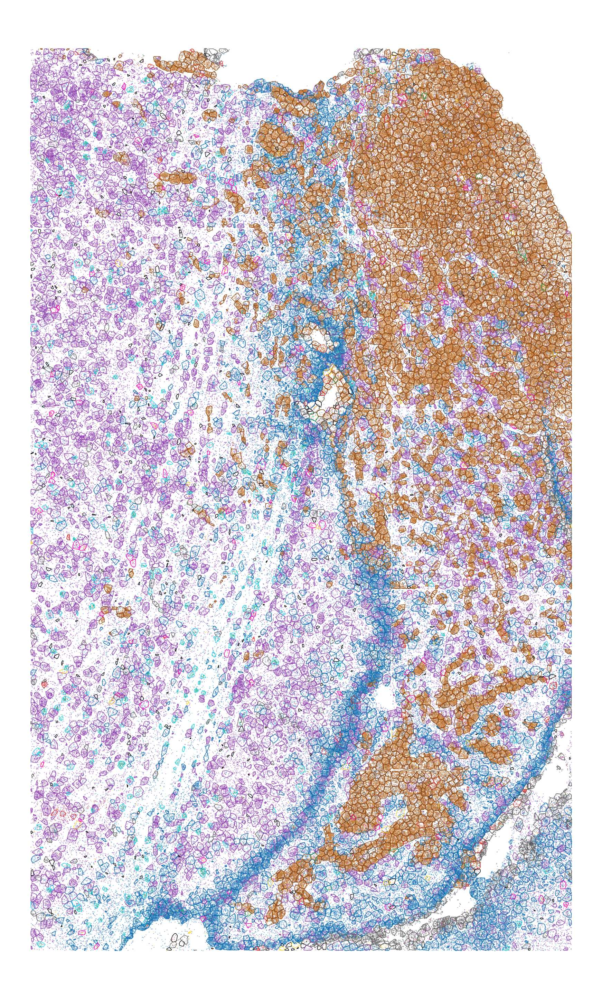

In [ ]:
#representación de la anotación
plot_annotation(df_gene_count_BR1_135_2, df_marker_count_BR1_135_2, df_baysor_results_BR1_135_2, genes_coloreados,  polygons_BR1_135_2, 
                colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 29, only_markers = True, cell_in = None)

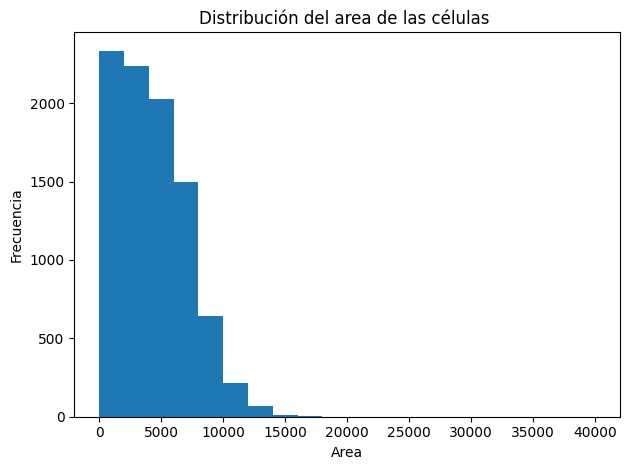

Número de tránscritos total: 1452998
Número total de células: 9028
Número de tránscritos por célula: 160.94350908285335


In [ ]:
#Crea archivo con un formato adecuado para la aplicación cytomap. Usaremos este archivo para realizar el análisis de expresión diferencial
df_cytomap_BR1_135_2 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/BR1_135_2/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_BR1_135_2, df_marker_count_BR1_135_2, genes_tipo, 'BR1_135_2')

#distribución de las células por su área
plot_area(df_cytomap_BR1_135_2, df_gene_count_BR1_135_2)

BR1_135_1

In [ ]:
df_baysor_results_BR1_135_1 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/BR1_135_1/baysor_segmentation/baysor_results.csv')
df_gene_count_BR1_135_1 = gene_count_csv(df_baysor_results_BR1_135_1, 'BR1_135_1')
df_gene_count_BR1_135_1 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/Analisis/BR1_135_1/gene_count_BR1_135_1.csv", index_col=0)
df_gene_count_BR1_135_1.index.name = None

df_marker_count_BR1_135_1 = cell_anotation(df_gene_count_BR1_135_1, genes_tipo)


polygons_BR1_135_1 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/Analisis/BR1_135_1/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)



Astrocytes 1991
Neurons 9751
Melanoma 4416
Leukocytes 3
B_cells 0
T_cells 23
Myeloid 100
Microglia 414
Dendritic_cells 15
Oligodendrocytes 2122
Vasculature 1226


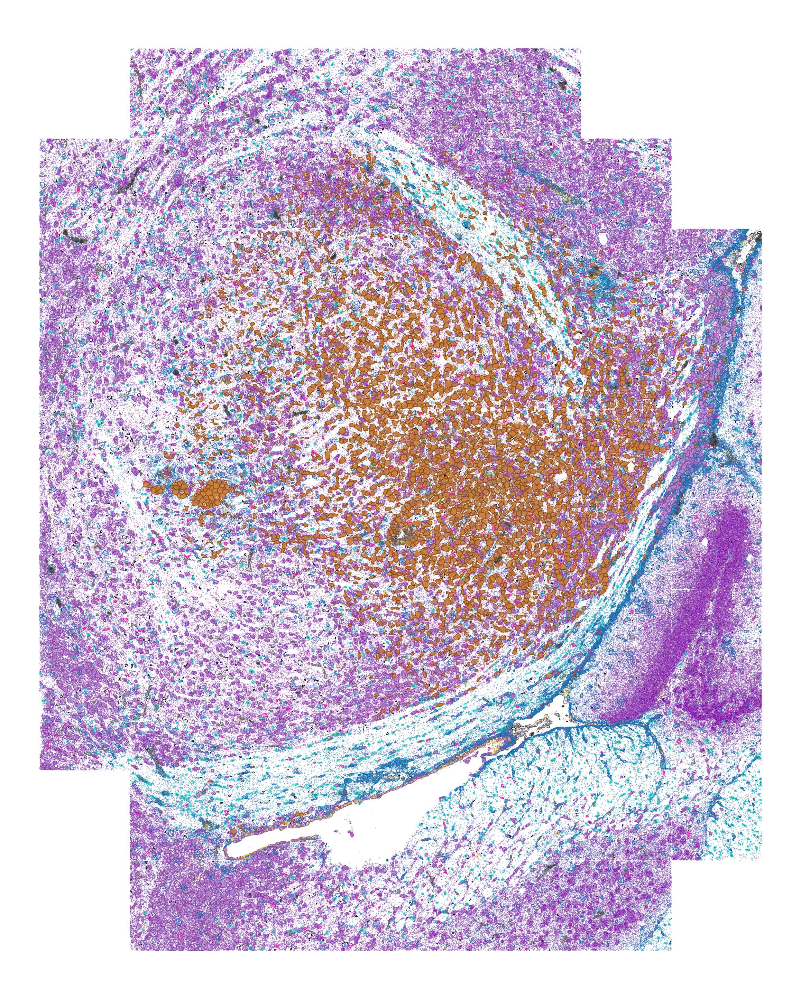

In [ ]:
plot_annotation(df_gene_count_BR1_135_1, df_marker_count_BR1_135_1, df_baysor_results_BR1_135_1, genes_coloreados,  polygons_BR1_135_1, 
                colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 29, only_markers = True, cell_in = None)

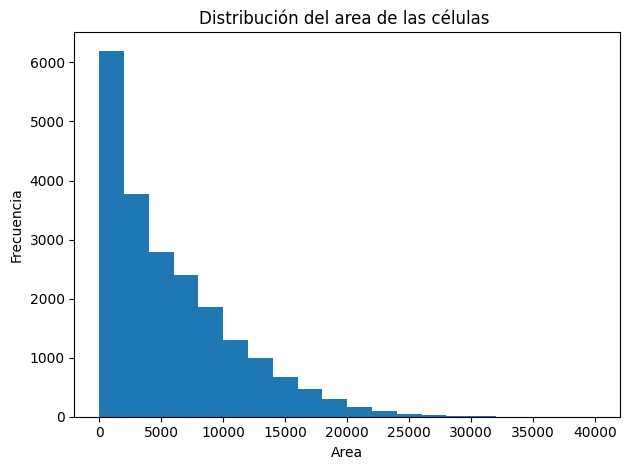

Número de tránscritos total: 3977560
Número total de células: 21127
Número de tránscritos por célula: 188.269039617551


In [ ]:
df_cytomap_BR1_135_1 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/BR1_135_1/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_BR1_135_1, df_marker_count_BR1_135_1, genes_tipo, 'BR1_135_1')
plot_area(df_cytomap_BR1_135_1, df_gene_count_BR1_135_1)

BR1_138


Astrocytes 2635
Neurons 6134
Melanoma 10121
Leukocytes 69
B_cells 3
T_cells 222
Myeloid 208
Microglia 503
Dendritic_cells 69
Oligodendrocytes 65
Vasculature 2755


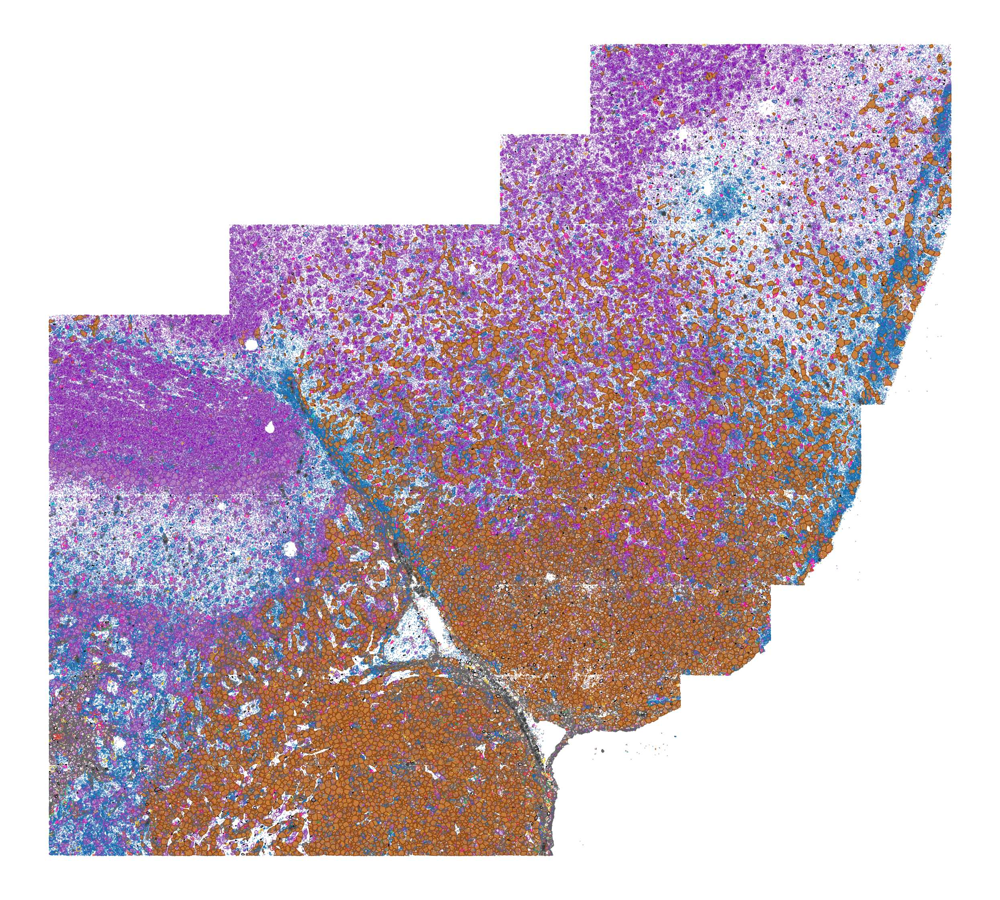

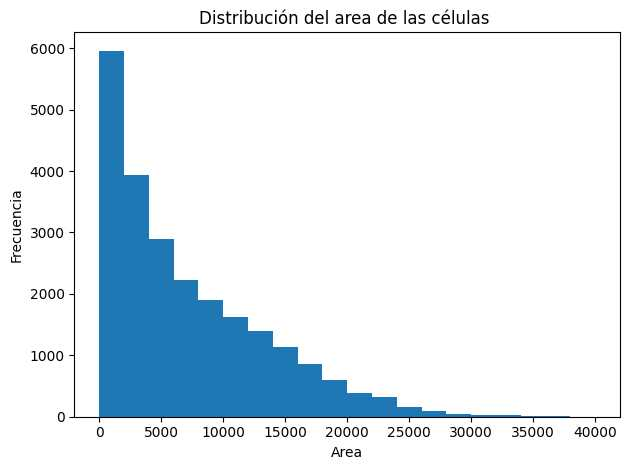

Número de tránscritos total: 5631946
Número total de células: 23615
Número de tránscritos por célula: 238.49019690874445


In [ ]:
df_baysor_results_BR1_138 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/BR1_138/baysor_segmentation/baysor_results.csv')
df_gene_count_BR1_138 = gene_count_csv(df_baysor_results_BR1_138, 'BR1_138')
df_gene_count_BR1_138 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/BR1_138/gene_count_BR1_138.csv", index_col=0)
df_gene_count_BR1_138.index.name = None   
df_marker_count_BR1_138 = cell_anotation(df_gene_count_BR1_138, genes_tipo)
polygons_BR1_138 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
"/Analisis/BR1_138/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)

plot_annotation(df_gene_count_BR1_138, df_marker_count_BR1_138, df_baysor_results_BR1_138, genes_coloreados,  polygons_BR1_138, 
                colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 25, only_markers = True, cell_in = None)
df_cytomap_BR1_138 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/BR1_138/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_BR1_138, df_marker_count_BR1_138, genes_tipo, 'BR1_138')
plot_area(df_cytomap_BR1_138, df_gene_count_BR1_138)

BR3_148

Esta muestra mostraba muchos tránscritos Cd4 por lo que se quitó para la identificación de linfocitos T, anotando solo como linfocitos T los que presentaban Cd3e, Cd8a o Foxp3. 

In [ ]:
genes_tipo_no_cd4 = {
    "Astrocytes": ["Gfap", "Aldh1l1", "Aqp4"],
    "Neurons": ["Map2", "Nefm", "Nsg2", "Rbfox3"],
    "Melanoma": ["Dct", "Mitf", "Pmel"],
    "T_cells": ["Foxp3", "Cd8a", "Cd3e"],
    "B_cells": ["Cd19"],
    "NK_cells": ["Klrg1", "Nkx1-1"],
    "Leukocytes": ["Ptprc"],
    "Dendritic_cells": ["Flt3","Itgae", "Itgax"],
    "Microglia": ["P2ry12", "Tmem119"],
    "Myeloid": ["Cd24a","Itgam", "Ly6g", "Adgre1"],
    "Oligodendrocytes": ["Mog", "Olig1"],
    "Vasculature": ["Acta2", "Fn1", "Myh11", "Pecam1"]}

Astrocytes 173
Neurons 3472
Melanoma 497
Leukocytes 0
B_cells 0
T_cells 2
Myeloid 10
Microglia 132
Dendritic_cells 1
Oligodendrocytes 210
Vasculature 340


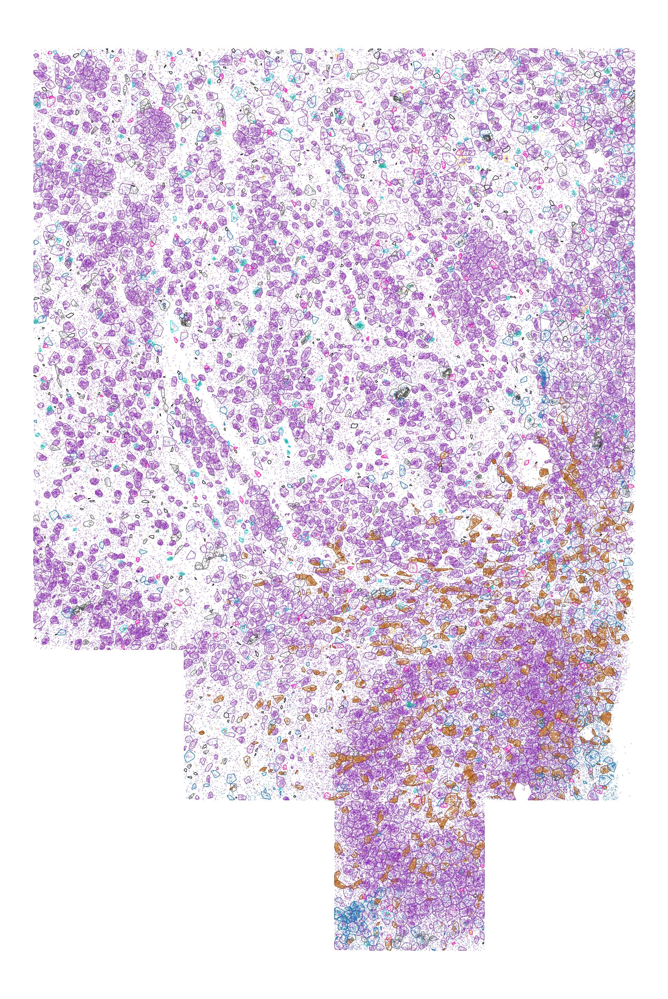

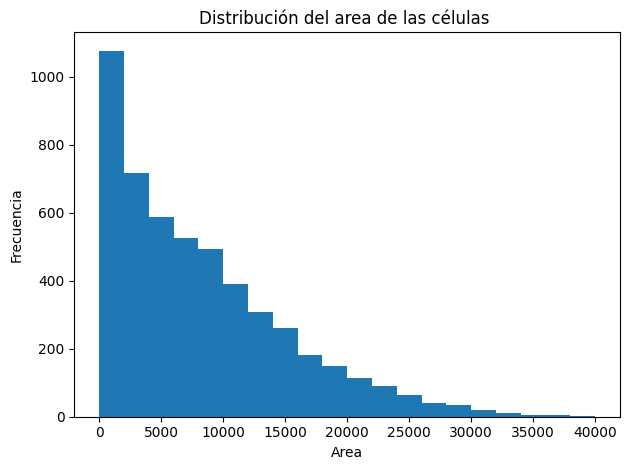

Número de tránscritos total: 1099712
Número total de células: 5081
Número de tránscritos por célula: 216.43613461916945


In [ ]:
df_baysor_results_BR3_148 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/BR3_148/baysor_segmentation/baysor_results.csv')
df_gene_count_BR3_148 = gene_count_csv(df_baysor_results_BR3_148, 'BR3_148')
df_gene_count_BR3_148 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/BR3_148/gene_count_BR3_148.csv", index_col=0)
df_gene_count_BR3_148.index.name = None   
df_marker_count_BR3_148 = cell_anotation(df_gene_count_BR3_148, genes_tipo_no_cd4)
polygons_BR3_148 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
"/Analisis/BR3_148/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)

plot_annotation(df_gene_count_BR3_148, df_marker_count_BR3_148, df_baysor_results_BR3_148, genes_coloreados,  polygons_BR3_148, 
                colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 29, only_markers = True, cell_in = None)

df_cytomap_BR3_148 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/BR3_148/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_BR3_148, df_marker_count_BR3_148, genes_tipo_no_cd4, 'BR3_148')
plot_area(df_cytomap_BR3_148, df_gene_count_BR3_148)

BR3_150_1

Astrocytes 957
Neurons 9185
Melanoma 678
Leukocytes 0
B_cells 0
T_cells 1
Myeloid 46
Microglia 483
Dendritic_cells 1
Oligodendrocytes 2714
Vasculature 1115


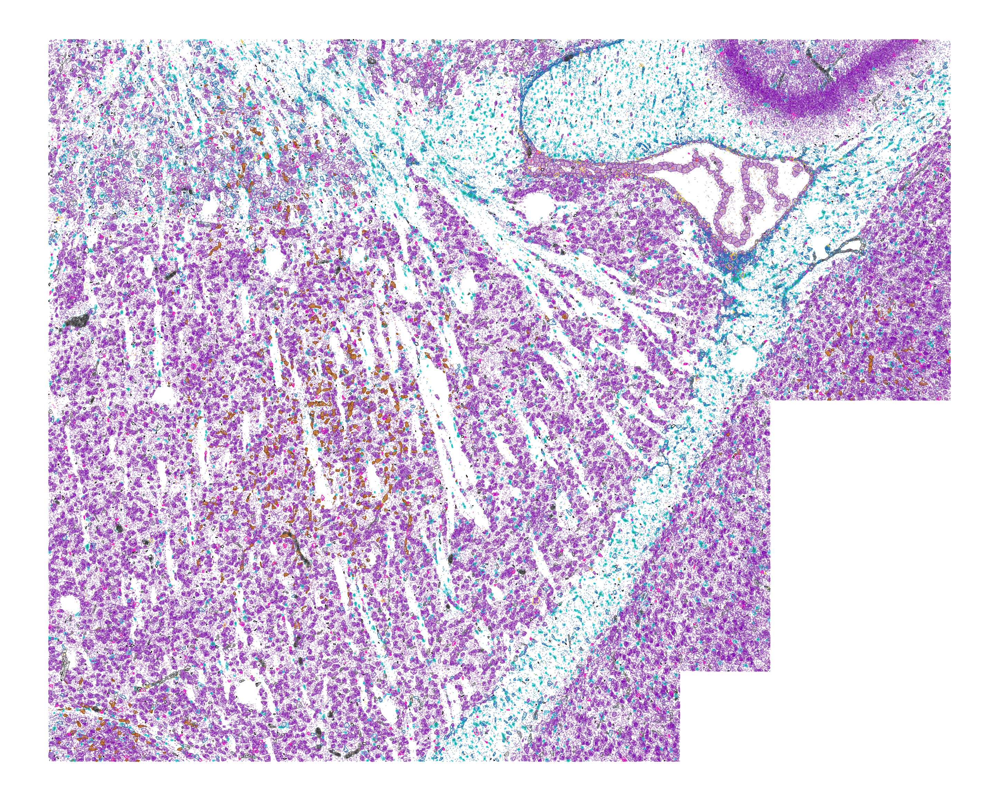

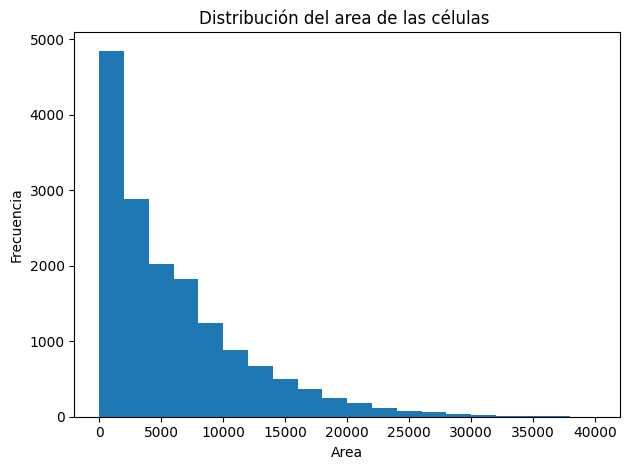

Número de tránscritos total: 2539510
Número total de células: 16003
Número de tránscritos por célula: 158.68962069611948


In [ ]:
df_baysor_results_BR3_150_1 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/BR3_150_1/baysor_segmentation/baysor_results.csv')
df_gene_count_BR3_150_1 = gene_count_csv(df_baysor_results_BR3_150_1, 'BR3_150_1')
df_gene_count_BR3_150_1 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/BR3_150_1/gene_count_BR3_150_1.csv", index_col=0)
df_gene_count_BR3_150_1.index.name = None   
df_marker_count_BR3_150_1 = cell_anotation(df_gene_count_BR3_150_1, genes_tipo_no_cd4)
polygons_BR3_150_1 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
"/Analisis/BR3_150_1/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)


plot_annotation(df_gene_count_BR3_150_1, df_marker_count_BR3_150_1, df_baysor_results_BR3_150_1, genes_coloreados,  polygons_BR3_150_1, 
                colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 29, only_markers = True, cell_in = None)



df_cytomap_BR3_150_1 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/BR3_150_1/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_BR3_150_1, df_marker_count_BR3_150_1, genes_tipo_no_cd4, 'BR3_150_1')
plot_area(df_cytomap_BR3_150_1, df_gene_count_BR3_150_1)

BR3_150_2

Astrocytes 716
Neurons 8836
Melanoma 282
Leukocytes 1
B_cells 0
T_cells 4
Myeloid 24
Microglia 185
Dendritic_cells 1
Oligodendrocytes 224
Vasculature 717


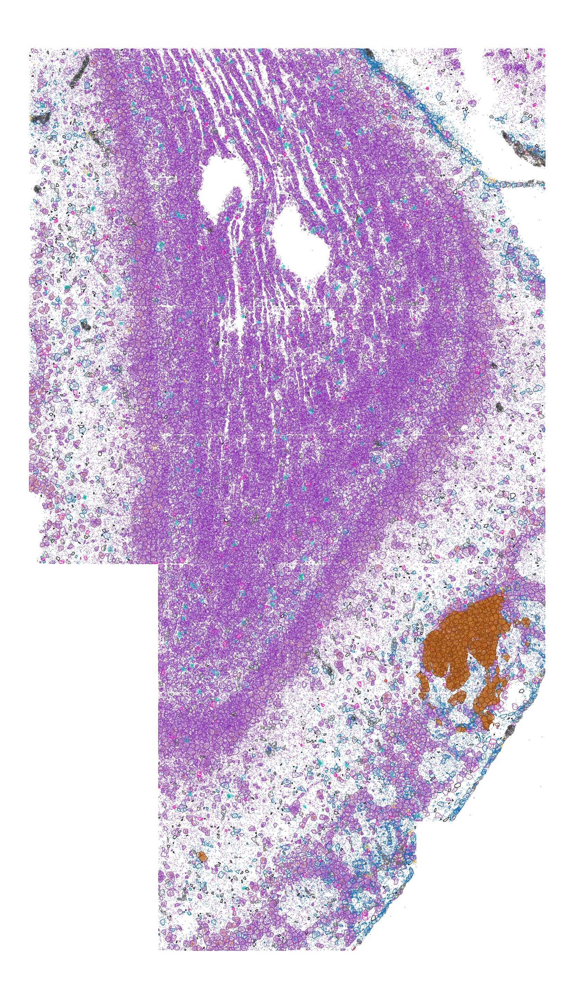

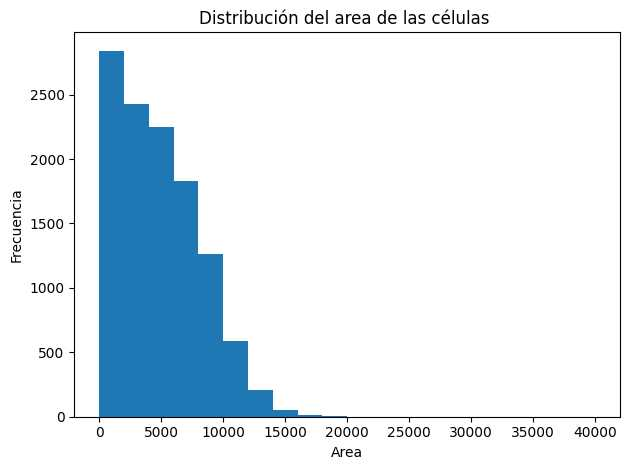

Número de tránscritos total: 2091190
Número total de células: 11486
Número de tránscritos por célula: 182.06425213303152


In [ ]:
df_baysor_results_BR3_150_2 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/BR3_150_2/baysor_segmentation/baysor_results.csv')
df_gene_count_BR3_150_2 = gene_count_csv(df_baysor_results_BR3_150_2, 'BR3_150_2')
df_gene_count_BR3_150_2 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/BR3_150_2/gene_count_BR3_150_2.csv", index_col=0)
df_gene_count_BR3_150_2.index.name = None   
df_marker_count_BR3_150_2 = cell_anotation(df_gene_count_BR3_150_2, genes_tipo)
polygons_BR3_150_2 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
"/Analisis/BR3_150_2/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)

plot_annotation(df_gene_count_BR3_150_2, df_marker_count_BR3_150_2, df_baysor_results_BR3_150_2, genes_coloreados,  polygons_BR3_150_2, 
                colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 29, only_markers = True, cell_in = None)
df_cytomap_BR3_150_2 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/BR3_150_2/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_BR3_150_2, df_marker_count_BR3_150_2, genes_tipo, 'BR3_150_2')
plot_area(df_cytomap_BR3_150_2, df_gene_count_BR3_150_2)

PBS_172_1

Astrocytes 875
Neurons 14235
Melanoma 4
Leukocytes 1
B_cells 0
T_cells 2
Myeloid 50
Microglia 376
Dendritic_cells 2
Oligodendrocytes 349
Vasculature 1058


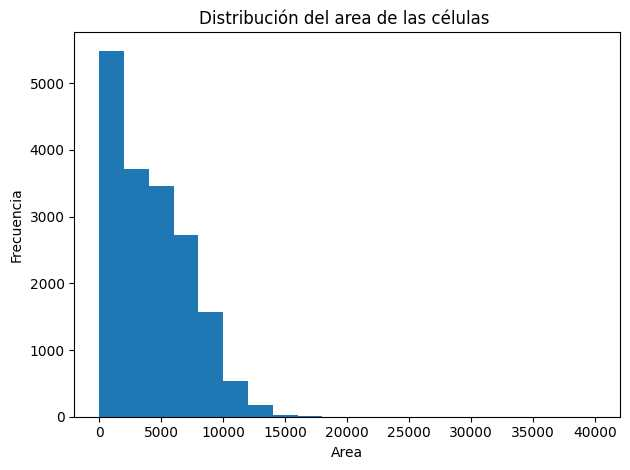

Número de tránscritos total: 2844411
Número total de células: 17719
Número de tránscritos por célula: 160.5288673175687


In [ ]:
df_baysor_results_PBS_172_1 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/PBS_172_1/baysor_segmentation/baysor_results.csv')
df_gene_count_PBS_172_1 = gene_count_csv(df_baysor_results_PBS_172_1, 'PBS_172_1')
df_gene_count_PBS_172_1 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/PBS_172_1/gene_count_PBS_172_1.csv", index_col=0)
df_gene_count_PBS_172_1.index.name = None   
df_marker_count_PBS_172_1 = cell_anotation(df_gene_count_PBS_172_1, genes_tipo)
# polygons_PBS_172_1 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
# "/Analisis/PBS_172_1/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)
# plot_annotation(df_gene_count_PBS_172_1, df_marker_count_PBS_172_1, df_baysor_results_PBS_172_1, genes_coloreados,  polygons_PBS_172_1, 
#                 colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = ['Melanoma'], 
#                 gene_in = None, size_fig = 29, only_markers = True, cell_in = None)
df_cytomap_PBS_172_1 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/PBS_172_1/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_PBS_172_1, df_marker_count_PBS_172_1, genes_tipo, 'PBS_172_1')
plot_area(df_cytomap_PBS_172_1, df_gene_count_PBS_172_1)

PBS_172_2

Astrocytes 347
Neurons 8291
Melanoma 0
Leukocytes 1
B_cells 1
T_cells 0
Myeloid 25
Microglia 265
Dendritic_cells 0
Oligodendrocytes 1853
Vasculature 877


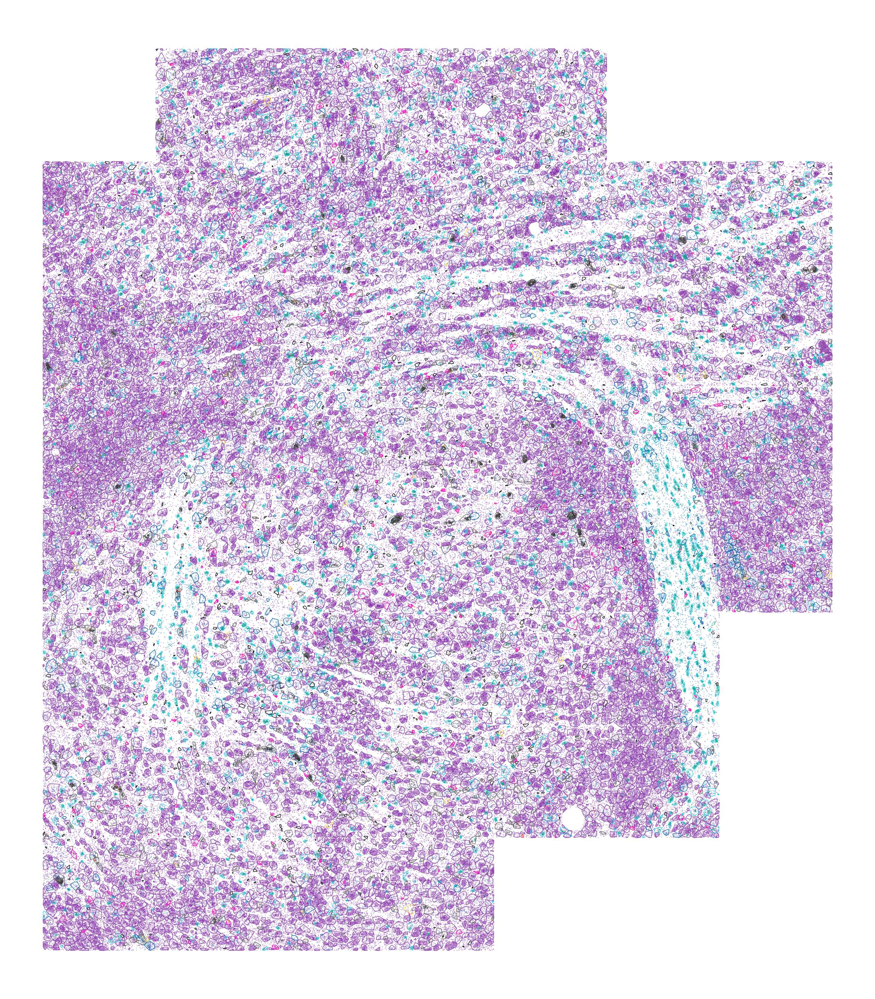

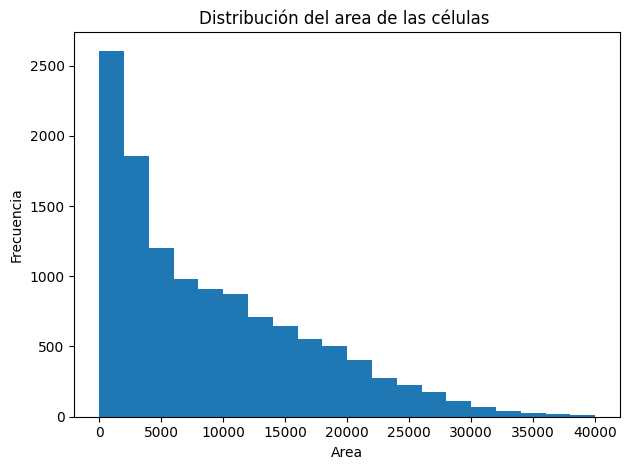

Número de tránscritos total: 2505192
Número total de células: 12210
Número de tránscritos por célula: 205.17542997542998


In [ ]:
df_baysor_results_PBS_172_2 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/PBS_172_2/baysor_segmentation/baysor_results.csv')
df_gene_count_PBS_172_2 = gene_count_csv(df_baysor_results_PBS_172_2, 'PBS_172_2')
df_gene_count_PBS_172_2 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/PBS_172_2/gene_count_PBS_172_2.csv", index_col=0)
df_gene_count_PBS_172_2.index.name = None   
df_marker_count_PBS_172_2 = cell_anotation(df_gene_count_PBS_172_2, genes_tipo)
polygons_PBS_172_2 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
"/Analisis/PBS_172_2/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)


plot_annotation(df_gene_count_PBS_172_2, df_marker_count_PBS_172_2, df_baysor_results_PBS_172_2, genes_coloreados,  polygons_PBS_172_2, 
                colores_tipo, genes_tipo, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 29, only_markers = True, cell_in = None)

df_cytomap_PBS_172_2 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/PBS_172_2/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_PBS_172_2, df_marker_count_PBS_172_2, genes_tipo, 'PBS_172_2')
plot_area(df_cytomap_PBS_172_2, df_gene_count_PBS_172_2)

PBS_172_3

Astrocytes 792
Neurons 4649
Melanoma 2
Leukocytes 1
B_cells 0
T_cells 3
Myeloid 67
Microglia 110
Dendritic_cells 3
Oligodendrocytes 502
Vasculature 440


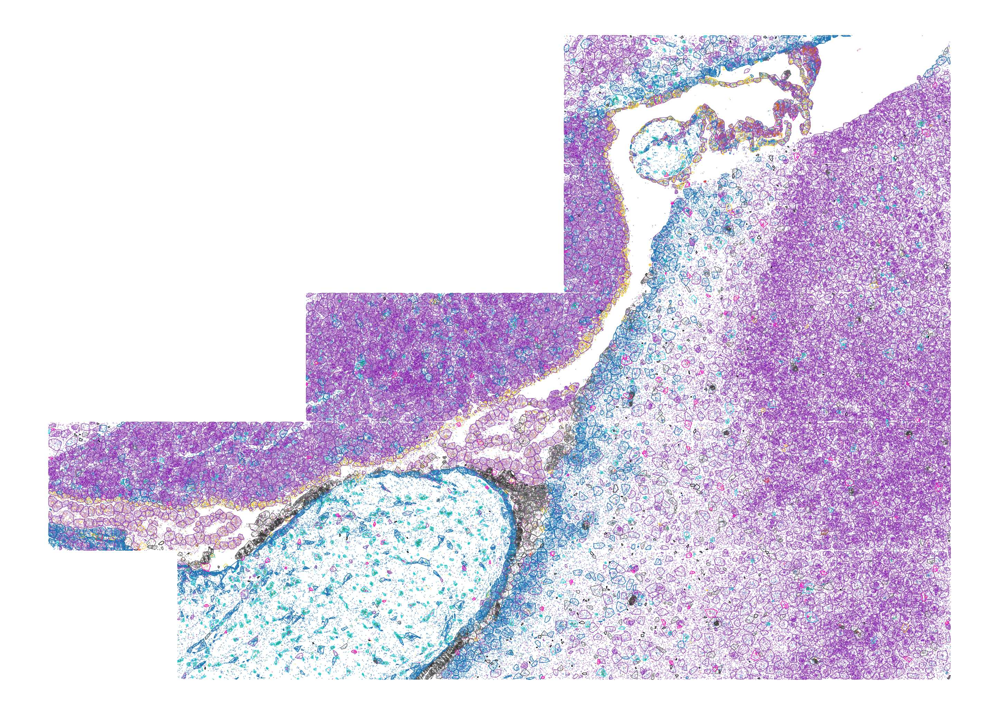

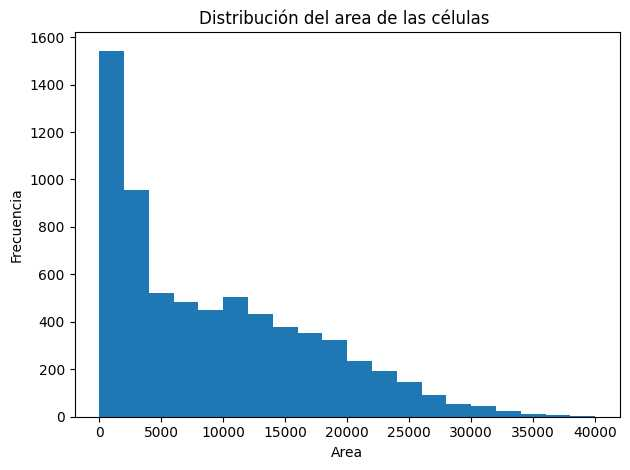

Número de tránscritos total: 1700853
Número total de células: 6757
Número de tránscritos por célula: 251.71718218144147


In [ ]:
df_baysor_results_PBS_172_3 = pd.read_csv('C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri'
'/Practicas/trabajo/propio/Analisis/PBS_172_3/baysor_segmentation/baysor_results.csv')
df_gene_count_PBS_172_3 = gene_count_csv(df_baysor_results_PBS_172_3, 'PBS_172_3')
df_gene_count_PBS_172_3 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo"
"/propio/Analisis/PBS_172_3/gene_count_PBS_172_3.csv", index_col=0)
df_gene_count_PBS_172_3.index.name = None   
df_marker_count_PBS_172_3 = cell_anotation(df_gene_count_PBS_172_3, genes_tipo)
polygons_PBS_172_3 = pd.read_csv("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio"
"/Analisis/PBS_172_3/baysor_segmentation/baysor_cell_polygons.csv", names=['cell', 'x', 'y'], header= None)


plot_annotation(df_gene_count_PBS_172_3, df_marker_count_PBS_172_3, df_baysor_results_PBS_172_3, genes_coloreados,  polygons_PBS_172_3, 
                colores_tipo, genes_tipo_no_cd4, gene_markers_to_represent = None, cell_types_to_represent = None, 
                gene_in = None, size_fig = 29, only_markers = True, cell_in = None)

df_cytomap_PBS_172_3 = csv_cytomap("C:/Users/ruben/Desktop/RUBEN/BBC_master/3_cuatri/Practicas/trabajo/propio/" \
"Analisis/PBS_172_3/baysor_segmentation/baysor_cell_stats.csv", df_gene_count_PBS_172_3, df_marker_count_PBS_172_3, genes_tipo, 'PBS_172_3')
plot_area(df_cytomap_PBS_172_3, df_gene_count_PBS_172_3)

A continuación se representa la presencia de células de cada tipo en cada tipo de tejido para mostrar la mayor infiltración de células inmunes en los tejidos de BR1. 

In [ ]:
# Definir las condiciones con sus respectivos DataFrames
conditions = {
    'BR1': [df_marker_count_BR1_135_2, df_marker_count_BR1_135_1, df_marker_count_BR1_138],
    'BR3': [df_marker_count_BR3_148, df_marker_count_BR3_150_1, df_marker_count_BR3_150_2],
    'Control_PBS': [df_marker_count_PBS_172_1, df_marker_count_PBS_172_2, df_marker_count_PBS_172_3]
}


all_data = []
for condition_name, dfs in conditions.items():
    for i, df in enumerate(dfs):
        type_count = df['Assigned_Cell_Type'].value_counts()
        type_count_pct = (type_count / type_count.sum() * 100)
        
        for cell_type, percentage in type_count_pct.items():
            all_data.append({
                'Tipo_Celular': cell_type,
                'Condición': condition_name,
                'Porcentaje': percentage,
                'Muestra': f'Sample_{i+1}'
            })
    
df_plot = pd.DataFrame(all_data)


C:\Users\ruben\AppData\Local\Temp\ipykernel_39284\3856328564.py:12: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_grupo1, x='Tipo_Celular', y='Porcentaje', hue='Condición',


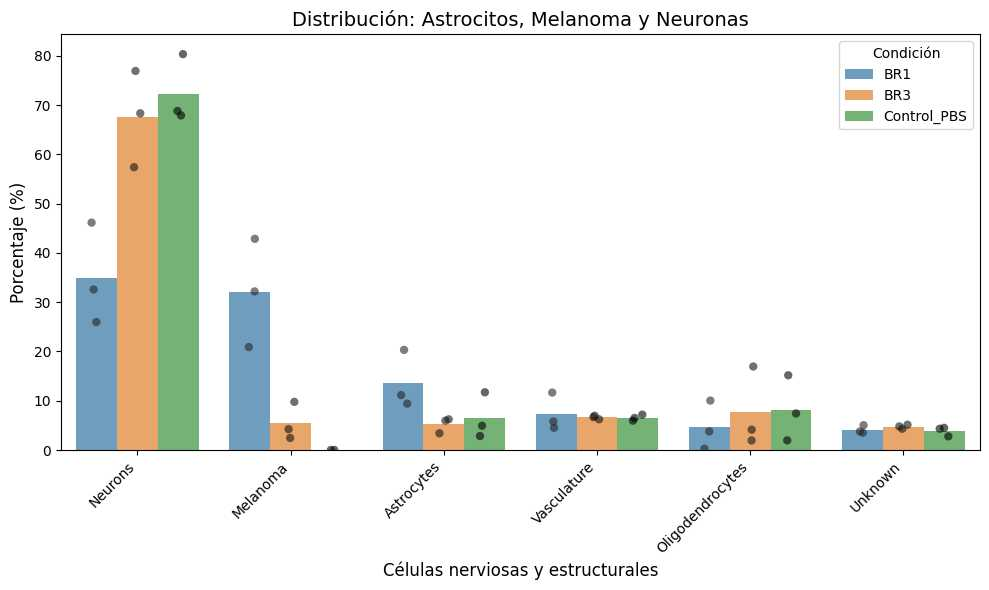

C:\Users\ruben\AppData\Local\Temp\ipykernel_39284\3856328564.py:27: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_grupo2, x='Tipo_Celular', y='Porcentaje', hue='Condición',


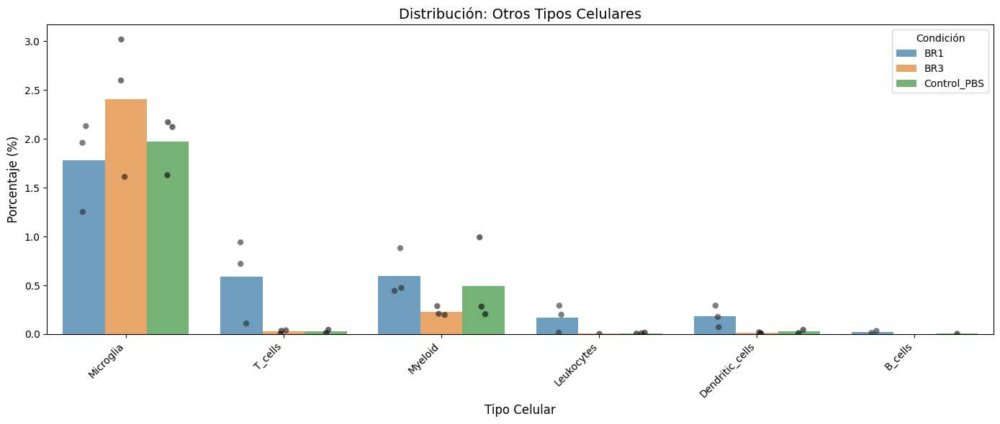

In [ ]:
# Definir los tipos celulares para cada gráfico
tipos_grupo1 = ['Neurons','Astrocytes', 'Melanoma',  'Oligodendrocytes', 'Vasculature', 'Unknown']
tipos_grupo2 = ['Microglia', 'T_cells', 'B_cells', 'Leukocytes', 'Dendritic_cells', 'Myeloid']  # Ajusta los nombres exactos
  # Ajusta los nombres exactos
df_grupo1 = df_plot[df_plot['Tipo_Celular'].isin(tipos_grupo1)]
df_grupo2 = df_plot[df_plot['Tipo_Celular'].isin(tipos_grupo2)]

# GRÁFICO 1: Astrocitos, Melanoma, Neuronas, Oligodendrocitos y Vasculatura
plt.figure(figsize=(10, 6))
sns.barplot(data=df_grupo1, x='Tipo_Celular', y='Porcentaje', hue='Condición', 
            errorbar=None, alpha=0.7)
sns.stripplot(data=df_grupo1, x='Tipo_Celular', y='Porcentaje', hue='Condición',
              dodge=True, color='black', alpha=0.6, size=6, legend=False)

plt.xlabel('Células nerviosas y estructurales', fontsize=12)
plt.ylabel('Porcentaje (%)', fontsize=12)
plt.title('Distribución: Astrocitos, Melanoma y Neuronas', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Condición')
plt.tight_layout()
plt.show()

# GRÁFICO 2: Resto de tipos celulares
plt.figure(figsize=(14, 6))
sns.barplot(data=df_grupo2, x='Tipo_Celular', y='Porcentaje', hue='Condición', 
            errorbar=None, alpha=0.7)
sns.stripplot(data=df_grupo2, x='Tipo_Celular', y='Porcentaje', hue='Condición',
              dodge=True, color='black', alpha=0.6, size=6, legend=False)

plt.xlabel('Tipo Celular', fontsize=12)
plt.ylabel('Porcentaje (%)', fontsize=12)
plt.title('Distribución: Otros Tipos Celulares', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Condición')
plt.tight_layout()
plt.show()

Análisis de cada tipo celular y por muestra

In [ ]:
# Lista de DataFrames en el orden correcto
df_list = [
    df_cytomap_BR1_135_2,
    df_cytomap_BR1_135_1,
    df_cytomap_BR1_138,
    df_cytomap_BR3_148,
    df_cytomap_BR3_150_1,
    df_cytomap_BR3_150_2,
    df_cytomap_PBS_172_1,
    df_cytomap_PBS_172_2,
    df_cytomap_PBS_172_3  
]



c:\Users\ruben\Desktop\RUBEN\BBC_master\3_cuatri\Practicas\trabajo\propio\Memoria\funciones_memoria.py:689: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot = df_padj.applymap(lambda x: '*' if x < padj_threshold else '')


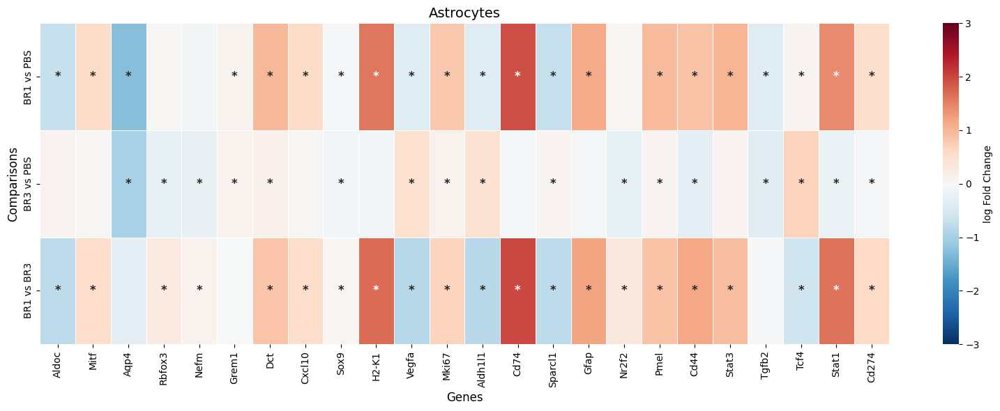

In [ ]:
# Uso:
df_BR1_astrocyte, df_BR3_astrocyte, df_PBS_astrocyte = all_sample_df(df_list, cell_type='Astrocytes')
deg_br1_vs_control = calculate_deg(df_BR1_astrocyte, df_PBS_astrocyte, test='mannwhitneyu')
deg_br3_vs_control = calculate_deg(df_BR3_astrocyte, df_PBS_astrocyte, test='mannwhitneyu')
deg_br1_vs_br3 = calculate_deg(df_BR1_astrocyte, df_BR3_astrocyte, test='mannwhitneyu')
# Generar plots
# fig1 = volcano_plot(deg_br1_vs_control, 'BR1 vs Control')
# fig2 = volcano_plot(deg_br3_vs_control, 'BR3 vs Control')
# fig3 = volcano_plot(deg_br1_vs_br3, 'BR1 vs BR3')


# Uso:
fig = multi_comparison_heatmap(deg_br1_vs_control, deg_br3_vs_control, deg_br1_vs_br3, 'Astrocytes')
plt.show()

c:\Users\ruben\Desktop\RUBEN\BBC_master\3_cuatri\Practicas\trabajo\propio\Memoria\funciones_memoria.py:689: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot = df_padj.applymap(lambda x: '*' if x < padj_threshold else '')


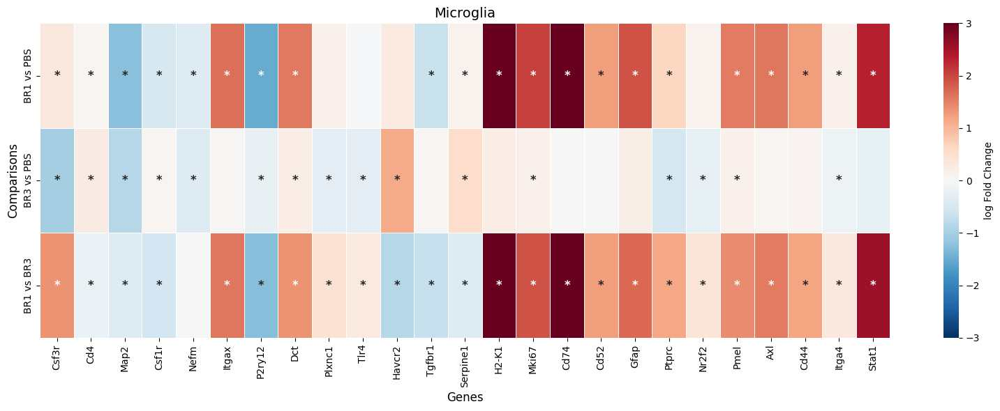

In [ ]:
# Uso:
df_BR1_microglia, df_BR3_microglia, df_PBS_microglia = all_sample_df(df_list, cell_type='Microglia')
deg_br1_vs_control = calculate_deg(df_BR1_microglia, df_PBS_microglia, test='mannwhitneyu')
deg_br3_vs_control = calculate_deg(df_BR3_microglia, df_PBS_microglia, test='mannwhitneyu')
deg_br1_vs_br3 = calculate_deg(df_BR1_microglia, df_BR3_microglia, test='mannwhitneyu')
# Generar plots
# fig1 = volcano_plot(deg_br1_vs_control, 'BR1 vs Control')
# fig2 = volcano_plot(deg_br3_vs_control, 'BR3 vs Control')
# fig3 = volcano_plot(deg_br1_vs_br3, 'BR1 vs BR3')


# Uso:
fig = multi_comparison_heatmap(deg_br1_vs_control, deg_br3_vs_control, deg_br1_vs_br3, 'Microglia')
plt.show()

c:\Users\ruben\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ruben\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ruben\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ruben\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ruben\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = ge

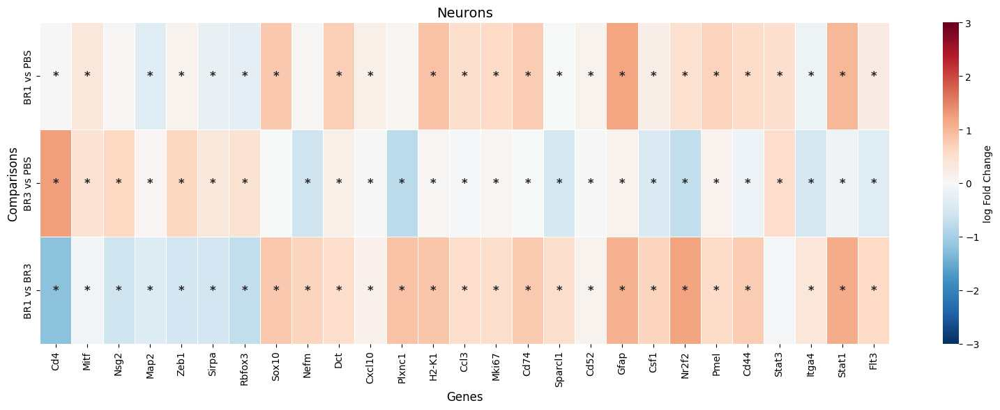

In [ ]:
# Uso:
df_BR1_neuron, df_BR3_neuron, df_PBS_neuron = all_sample_df(df_list, cell_type='Neurons')
deg_br1_vs_control = calculate_deg(df_BR1_neuron, df_PBS_neuron, test='mannwhitneyu')
deg_br3_vs_control = calculate_deg(df_BR3_neuron, df_PBS_neuron, test='mannwhitneyu')
deg_br1_vs_br3 = calculate_deg(df_BR1_neuron, df_BR3_neuron, test='mannwhitneyu')
# Generar plots
# fig1 = volcano_plot(deg_br1_vs_control, 'BR1 vs Control')
# fig2 = volcano_plot(deg_br3_vs_control, 'BR3 vs Control')
# fig3 = volcano_plot(deg_br1_vs_br3, 'BR1 vs BR3')


# Uso:
fig = multi_comparison_heatmap(deg_br1_vs_control, deg_br3_vs_control, deg_br1_vs_br3, 'Neurons')
plt.show()

c:\Users\ruben\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ruben\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ruben\Desktop\RUBEN\BBC_master\3_cuatri\Practicas\trabajo\propio\Memoria\funciones_memoria.py:689: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot = df_padj.applymap(lambda x: '*' if x < padj_threshold else '')


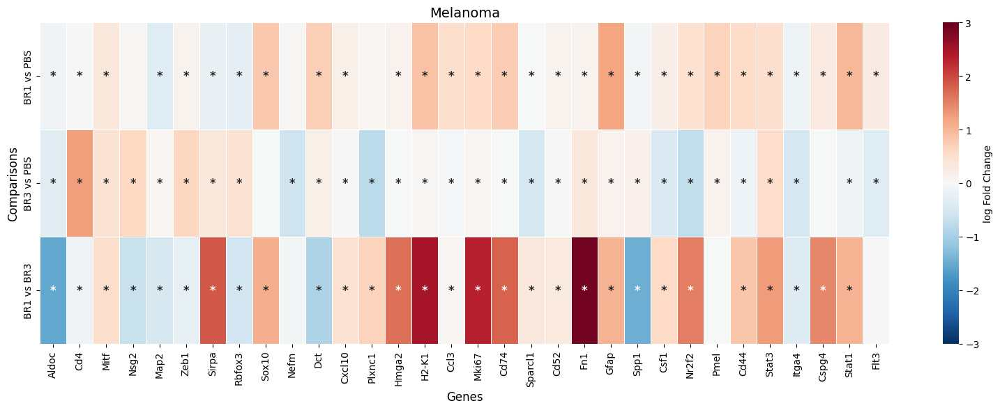

In [ ]:
# Uso:
df_BR1_melanoma, df_BR3_melanoma, df_PBS_melanoma = all_sample_df(df_list, cell_type='Melanoma')
#deg_br1_vs_control = calculate_deg(df_BR1_melanoma, df_PBS_melanoma, test='mannwhitneyu')
#deg_br3_vs_control = calculate_deg(df_BR3_melanoma, df_PBS_melanoma, test='mannwhitneyu')
deg_br1_vs_br3 = calculate_deg(df_BR1_melanoma, df_BR3_melanoma, test='mannwhitneyu')
# Generar plots
# fig1 = volcano_plot(deg_br1_vs_control, 'BR1 vs Control')
# fig2 = volcano_plot(deg_br3_vs_control, 'BR3 vs Control')
# fig3 = volcano_plot(deg_br1_vs_br3, 'BR1 vs BR3')


# Uso:
fig = multi_comparison_heatmap(deg_br1_vs_control, deg_br3_vs_control, deg_br1_vs_br3, 'Melanoma')
#fig = multi_comparison_heatmap(deg_br1_vs_br3, 'Melanoma')

plt.show()

Vamos a organizar las células por regiones, melanoma y no melanoma. Si una célula ponle que son de media unas 10 micras, vamos a poner dos radios: uno de 100 micras y otro de 400, más exagerado. Esto trasportado a pixeles son 700 y 2800, que en verdad es un huevo. Confirmo que en otras muestras la proporción también es de 7 píxeles a 1 micrómetro.

In [ ]:
print(min(df_baysor_results_BR3_148['x']), max(df_baysor_results_BR3_148['x']), min(df_baysor_results_BR3_148['y']), max(df_baysor_results_BR3_148['y']))
print(min(df_baysor_results_BR1_138['x']), max(df_baysor_results_BR1_138['x']), min(df_baysor_results_BR1_138['y']), max(df_baysor_results_BR1_138['y']))
print(min(df_baysor_results_PBS_172_1['x']), max(df_baysor_results_PBS_172_1['x']), min(df_baysor_results_PBS_172_1['y']), max(df_baysor_results_PBS_172_1['y']))


2.0 8572.0 2.0 12853.0
2.0 21436.0 1.0 19289.0
3.0 15004.0 0.0 15000.0


Número de células en la región 0: 4914
Número de células en la región 1: 1208


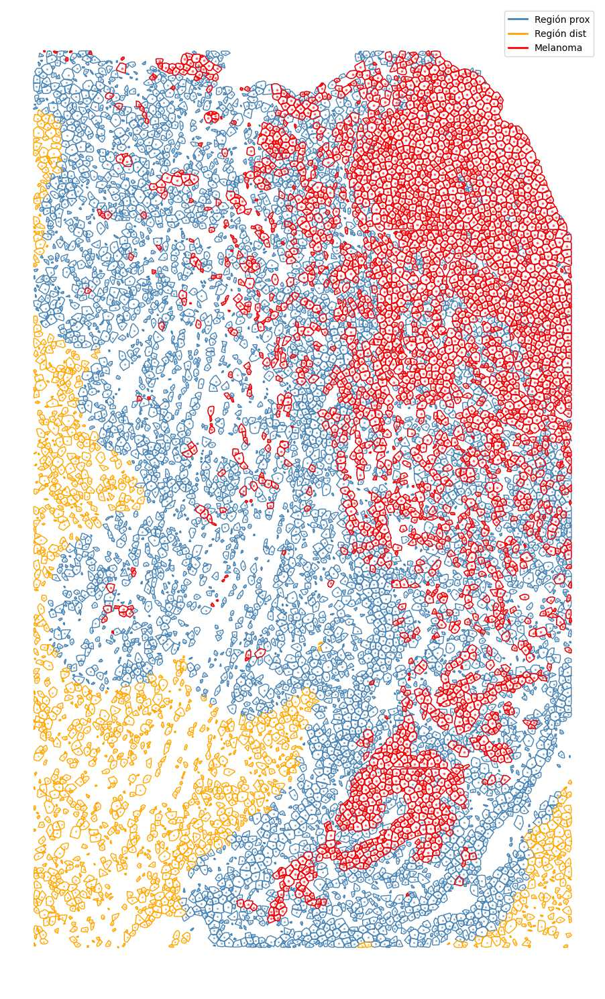

In [ ]:
radios = [700]
df_region_1_BR1_135_2, df_region_2_BR1_135_2 = divide_regions(df_cytomap_BR1_135_2, radios)
plot_melanoma_by_region(
    df_marker_count_list = [df_region_1_BR1_135_2, df_region_2_BR1_135_2],
    baysor_polygons      = polygons_BR1_135_2,
    region_colors        = ["steelblue", "orange"],
    melanoma_color       = "red",
    region_names         = ["Región prox", "Región dist"],
    size_fig=15, show_scatter=True, scatter_size=5, scatter_alpha=0.6
)

In [ ]:
df_BR_list = [
    df_cytomap_BR1_135_2,
    df_cytomap_BR1_135_1,
    df_cytomap_BR1_138,
    df_cytomap_BR3_148,
    df_cytomap_BR3_150_1,
    df_cytomap_BR3_150_2
]

In [ ]:
df_BR1_astrocyte, df_BR3_astrocyte, df_PBS_astrocyte = all_sample_df(df_list, cell_type='Astrocytes')
df_region1_BR1_astrocyte, df_region2_BR1_astrocyte, df_region1_BR3_astrocyte, df_region2_BR3_astrocyte = all_sample_division_df(df_BR_list, cell_type='Astrocytes', radio=700)


Número de células en la región 0: 4914
Número de células en la región 1: 1208
Número de células en la región 0: 7468
Número de células en la región 1: 9243
Número de células en la región 0: 10698
Número de células en la región 1: 2796
Número de células en la región 0: 1828
Número de células en la región 1: 2756
Número de células en la región 0: 5421
Número de células en la región 1: 9904
Número de células en la región 0: 923
Número de células en la región 1: 10281
BR1 Región 1 (Astrocytes): 4832 células
BR1 Región 2 (Astrocytes): 1629 células
BR3 Región 1 (Astrocytes): 481 células
BR3 Región 2 (Astrocytes): 1365 células


c:\Users\ruben\Desktop\RUBEN\BBC_master\3_cuatri\Practicas\trabajo\propio\Memoria\funciones_memoria.py:799: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot = df_padj.applymap(lambda x: '*' if x < padj_threshold else '')


✓ Heatmap generado con 48 genes únicos
✓ Comparaciones: 8


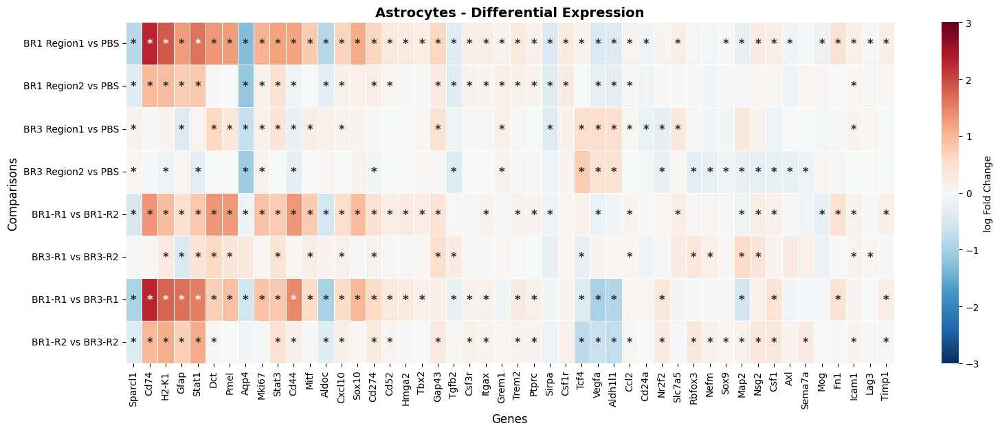

In [ ]:
deg_br1_r1_vs_pbs = calculate_deg(df_region1_BR1_astrocyte, df_PBS_astrocyte, test='mannwhitneyu')
deg_br1_r2_vs_pbs = calculate_deg(df_region2_BR1_astrocyte, df_PBS_astrocyte, test='mannwhitneyu')
deg_br3_r1_vs_pbs = calculate_deg(df_region1_BR3_astrocyte, df_PBS_astrocyte, test='mannwhitneyu')
deg_br3_r2_vs_pbs = calculate_deg(df_region2_BR3_astrocyte, df_PBS_astrocyte, test='mannwhitneyu')
deg_br1_r1_vs_r2 = calculate_deg(df_region1_BR1_astrocyte, df_region2_BR1_astrocyte, test='mannwhitneyu')
deg_br3_r1_vs_r2 = calculate_deg(df_region1_BR3_astrocyte, df_region2_BR3_astrocyte, test='mannwhitneyu')
deg_br1_r1_vs_br3_r1 = calculate_deg(df_region1_BR1_astrocyte, df_region1_BR3_astrocyte, test='mannwhitneyu')
deg_br1_r2_vs_br3_r2 = calculate_deg(df_region2_BR1_astrocyte, df_region2_BR3_astrocyte, test='mannwhitneyu')

# Lista de análisis DEG
deg_list = [
    deg_br1_r1_vs_pbs,
    deg_br1_r2_vs_pbs,
    deg_br3_r1_vs_pbs,
    deg_br3_r2_vs_pbs,
    deg_br1_r1_vs_r2,
    deg_br3_r1_vs_r2,
    deg_br1_r1_vs_br3_r1,
    deg_br1_r2_vs_br3_r2
]

# Nombres de las comparaciones
comparison_names = [
    'BR1 Region1 vs PBS',
    'BR1 Region2 vs PBS',
    'BR3 Region1 vs PBS',
    'BR3 Region2 vs PBS',
    'BR1-R1 vs BR1-R2',
    'BR3-R1 vs BR3-R2',
    'BR1-R1 vs BR3-R1',
    'BR1-R2 vs BR3-R2'
]

# Generar heatmap
fig, genes = region_comparison_heatmap(
    deg_list=deg_list,
    comparison_names=comparison_names,
    cell_type='Astrocytes',
    top_n=20,
    padj_threshold=0.05
)

plt.show()




In [ ]:
df_BR1_microglia, df_BR3_microglia, df_PBS_microglia = all_sample_df(df_list, cell_type='Microglia')
df_region1_BR1_microglia, df_region2_BR1_microglia, df_region1_BR3_microglia, df_region2_BR3_microglia  = all_sample_division_df(df_BR_list, cell_type='Microglia', radio=700)


Número de células en la región 0: 4914
Número de células en la región 1: 1208
Número de células en la región 0: 7468
Número de células en la región 1: 9243
Número de células en la región 0: 10698
Número de células en la región 1: 2796
Número de células en la región 0: 1828
Número de células en la región 1: 2756
Número de células en la región 0: 5421
Número de células en la región 1: 9904
Número de células en la región 0: 923
Número de células en la región 1: 10281
BR1 Región 1 (Microglia): 788 células
BR1 Región 2 (Microglia): 242 células
BR3 Región 1 (Microglia): 277 células
BR3 Región 2 (Microglia): 523 células


c:\Users\ruben\Desktop\RUBEN\BBC_master\3_cuatri\Practicas\trabajo\propio\Memoria\funciones_memoria.py:799: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot = df_padj.applymap(lambda x: '*' if x < padj_threshold else '')


✓ Heatmap generado con 51 genes únicos
✓ Comparaciones: 8


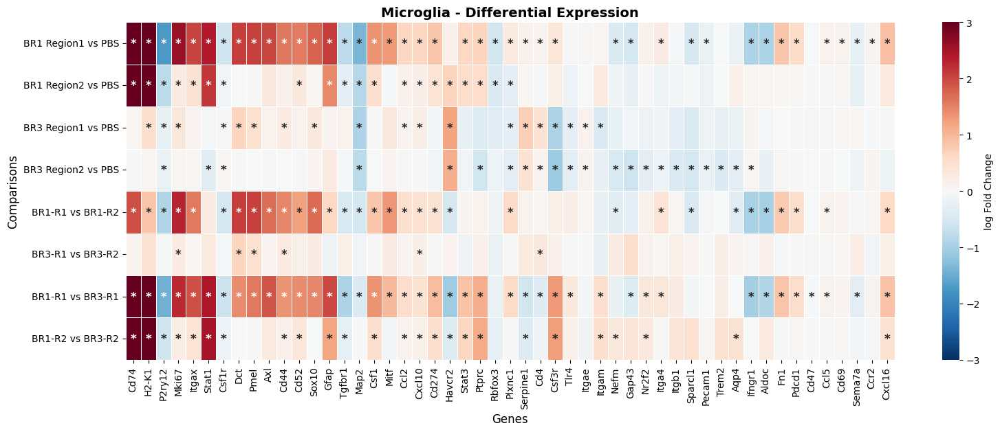

In [ ]:
deg_br1_r1_vs_pbs = calculate_deg(df_region1_BR1_microglia, df_PBS_microglia, test='mannwhitneyu')
deg_br1_r2_vs_pbs = calculate_deg(df_region2_BR1_microglia, df_PBS_microglia, test='mannwhitneyu')
deg_br3_r1_vs_pbs = calculate_deg(df_region1_BR3_microglia, df_PBS_microglia, test='mannwhitneyu')
deg_br3_r2_vs_pbs = calculate_deg(df_region2_BR3_microglia, df_PBS_microglia, test='mannwhitneyu')
deg_br1_r1_vs_r2 = calculate_deg(df_region1_BR1_microglia, df_region2_BR1_microglia, test='mannwhitneyu')
deg_br3_r1_vs_r2 = calculate_deg(df_region1_BR3_microglia, df_region2_BR3_microglia, test='mannwhitneyu')
deg_br1_r1_vs_br3_r1 = calculate_deg(df_region1_BR1_microglia, df_region1_BR3_microglia, test='mannwhitneyu')
deg_br1_r2_vs_br3_r2 = calculate_deg(df_region2_BR1_microglia, df_region2_BR3_microglia, test='mannwhitneyu')

# Lista de análisis DEG
deg_list = [
    deg_br1_r1_vs_pbs,
    deg_br1_r2_vs_pbs,
    deg_br3_r1_vs_pbs,
    deg_br3_r2_vs_pbs,
    deg_br1_r1_vs_r2,
    deg_br3_r1_vs_r2,
    deg_br1_r1_vs_br3_r1,
    deg_br1_r2_vs_br3_r2
]

# Nombres de las comparaciones
comparison_names = [
    'BR1 Region1 vs PBS',
    'BR1 Region2 vs PBS',
    'BR3 Region1 vs PBS',
    'BR3 Region2 vs PBS',
    'BR1-R1 vs BR1-R2',
    'BR3-R1 vs BR3-R2',
    'BR1-R1 vs BR3-R1',
    'BR1-R2 vs BR3-R2'
]

# Generar heatmap
fig, genes_microglia= region_comparison_heatmap(
    deg_list=deg_list,
    comparison_names=comparison_names,
    cell_type='Microglia',
    top_n=20,
    padj_threshold=0.05
)

plt.show()

